# Interactive CATMAID Neuron Explorer

This notebook demonstrates how to build interactive matplotlib widgets to explore neuronal data from CATMAID using pymaid, navis, and ipywidgets.

## Import Libraries and Setup

In [3]:
# Import necessary libraries for CATMAID access and neuronal data processing
import pymaid
import navis
import numpy as np
import matplotlib.pyplot as plt

# Import libraries for interactive widgets
import ipywidgets as widgets
from ipywidgets import interact, interactive, fixed, interact_manual
from IPython.display import display, clear_output

# For 3D visualization
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.colors as mcolors

# For layout and styling
from ipywidgets import Layout, Box, VBox, HBox

# Set matplotlib style
%matplotlib widget
%load_ext autoreload
%autoreload 2

plt.style.use('./neuromorph.mplstyle')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### Connect to CATMAID Server

In [4]:
# Read CATMAID credentials from a file (e.g., api.txt)
creds = {}
with open('./api.txt', 'r') as f:
    for line in f:
        if '=' in line:
            key, value = line.strip().split('=', 1)
            creds[key.strip()] = value.strip()

API_TOKEN = creds.get('api_token')
HTTP_USER = creds.get('http_user')
HTTP_PASSWORD = creds.get('http_password')
SERVER = creds.get('server')

# Connect to CATMAID server
rm = pymaid.CatmaidInstance(
    server=SERVER,
    api_token=API_TOKEN,
    project_id=1,
    http_user=HTTP_USER,
    http_password=HTTP_PASSWORD
)

# Set up a function to fetch neurons with progress feedback
def fetch_neurons(skids):
    pymaid.clear_cache()
    print(f"Fetching {len(skids)} neurons...")
    return pymaid.get_neuron(skids)

INFO  : Global CATMAID instance set. Caching is ON. (pymaid)


In [5]:
# skids = pymaid.get_skids_by_annotation(['DANs','T2 ladders'])
skids = pymaid.get_skids_by_annotation(['A27a','Drunken-1','Ladder-d','baton','hook-1','Jupiter'])
skids

INFO  : Cached data used. Use `pymaid.clear_cache()` to clear. (pymaid)


Fetching:   0%|          | 0/6 [00:00<?, ?it/s]

[6207232,
 7747969,
 4228864,
 4540046,
 11024782,
 471705,
 2123422,
 14046245,
 2697511,
 16066985,
 255168,
 12542019,
 5997132,
 7606100,
 2784471,
 12233573,
 2585319,
 4096366,
 2763260,
 12001789]

In [6]:
tn_table = pymaid.get_node_table(skids[0])
tn_table.head()

INFO  : Retrieving 1 node table(s)... (pymaid)
INFO  : 4346 nodes retrieved. Creating table... (pymaid)


Creating table:   0%|          | 0/1 [00:00<?, ?it/s]

,node_id,parent_node_id,confidence,x,y,z,radius,creator,last_edited,skeleton_id,reviewers,tags
0,12418116,15041002,5,64881.20,87669.8,122950.0,-1.0,caseysm,2014-09-16 20:48:44+00:00,6207232,[caseysm],NaN
1,20877679,20877676,5,62453.95,88059.3,103150.0,-1.0,caseysm,2015-07-14 19:03:11+00:00,6207232,[caseysm],NaN
2,20877682,20877677,5,62508.10,88103.0,103000.0,-1.0,caseysm,2015-07-14 19:03:14+00:00,6207232,[caseysm],[ends]
3,20877688,20877690,5,55542.70,86037.7,123500.0,-1.0,caseysm,2015-07-14 19:04:40+00:00,6207232,[caseysm],NaN
4,20877689,20877688,5,55348.90,86260.0,123650.0,-1.0,caseysm,2015-07-14 19:04:38+00:00,6207232,[caseysm],NaN


In [7]:
pymaid.clear_cache()
neuron_list = pymaid.get_neuron(skids)
neuron_list.head(20)

INFO  : Cached cleared. (pymaid)


Fetch neurons:   0%|          | 0/20 [00:00<?, ?it/s]

Make nrn:   0%|          | 0/20 [00:00<?, ?it/s]

,type,name,skeleton_id,n_nodes,n_connectors,n_branches,n_leafs,cable_length,soma,units
0,CatmaidNeuron,Drunken-1 a1l,6207232,4346,331,155,163,453908.62500,[6256846],1 nanometer
1,CatmaidNeuron,A08f a2r,7747969,4707,219,107,115,400207.78125,[7914596],1 nanometer
2,CatmaidNeuron,"A08h2_a2r (Jupiter right, not NB3-3)",4228864,4395,351,137,141,440292.03125,[4228868],1 nanometer
3,CatmaidNeuron,hook-1_a2l,4540046,5272,162,82,83,457285.18750,[4540008],1 nanometer
4,CatmaidNeuron,"A08h2_a2l (Jupiter left, not NB3-3)",11024782,4543,349,129,132,466062.59375,[2790686],1 nanometer
5,CatmaidNeuron,Ladder-d_a1,471705,6727,492,141,144,597419.31250,[473112],1 nanometer
6,CatmaidNeuron,hook-1_a1l,2123422,5970,299,124,130,530456.87500,[2137351],1 nanometer
7,CatmaidNeuron,A27a_a1r,14046245,2148,176,137,147,290691.37500,[19194387],1 nanometer
8,CatmaidNeuron,hook-1 a3r,2697511,2120,69,33,34,217476.40625,[2700071],1 nanometer
9,CatmaidNeuron,A27a_a1l,16066985,2189,157,134,142,272516.84375,[19474773],1 nanometer


Fetch neurons:   0%|          | 0/20 [00:00<?, ?it/s]

INFO  : Cached data used. Use `pymaid.clear_cache()` to clear. (pymaid)
INFO  : Cached data used. Use `pymaid.clear_cache()` to clear. (pymaid)


Make nrn:   0%|          | 0/20 [00:00<?, ?it/s]

INFO  : Cached data used. Use `pymaid.clear_cache()` to clear. (pymaid)
INFO  : Cached data used. Use `pymaid.clear_cache()` to clear. (pymaid)


Plot neurons:   0%|          | 0/20 [00:00<?, ?it/s]

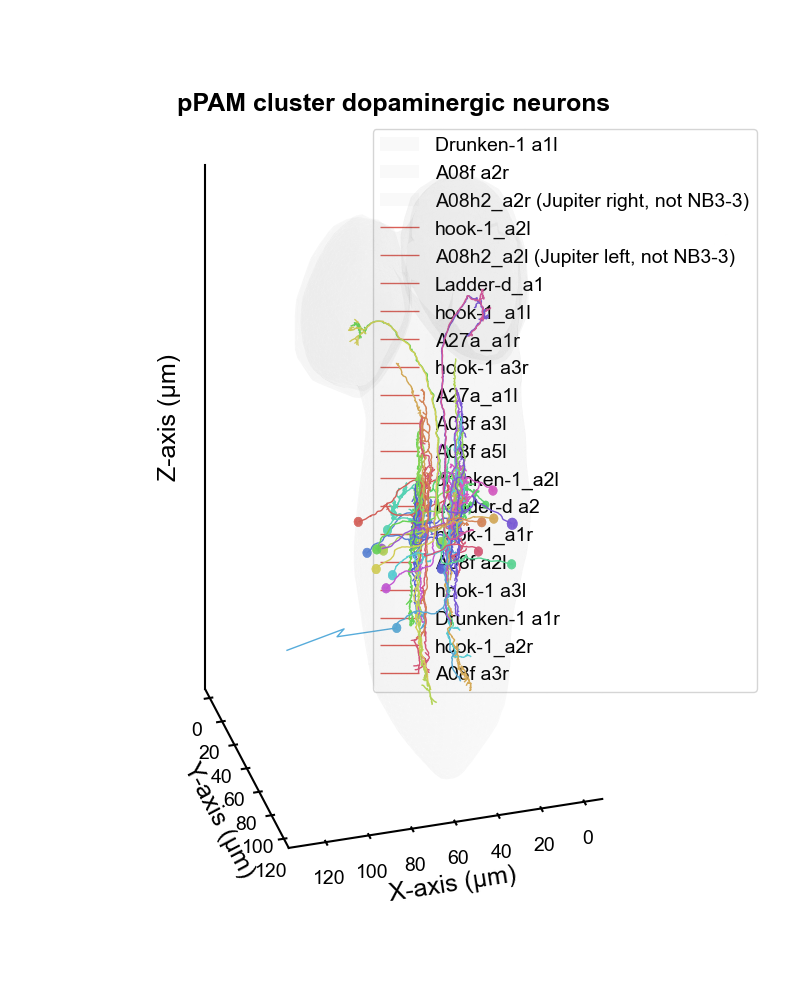

In [8]:
# Get two example neurons by their skeleton ID
nl = pymaid.get_neurons(neuron_list)

# Color all neurons the same (e.g., dark blue), except for the specified ones


# List all required volume names
volume_names = [
    'Brain Hemisphere left', 'Brain Hemisphere right', 
    'cns'
]

# Fetch all volumes
volumes = []
for name in volume_names:
    try:
        v = pymaid.get_volume(name)
        v.color = (0.7, 0.7, 0.7, 0.03)  # RGBA: light grey, very low alpha
        volumes.append(v)
    except Exception as e:
        print(f"Could not fetch volume '{name}': {e}")

# Combine neurons and volumes
objects_to_plot = [nl] + volumes

# Plot using default settings with customization
fig, ax = navis.plot2d(objects_to_plot, method='3d_complex')

# Create a formatter function to display values in microns
def micron_formatter(x, pos):
    return f'{x/1000:.0f}'

from matplotlib.ticker import FuncFormatter
ax.xaxis.set_major_formatter(FuncFormatter(micron_formatter))
ax.yaxis.set_major_formatter(FuncFormatter(micron_formatter))
ax.zaxis.set_major_formatter(FuncFormatter(micron_formatter))

fontsize_title = 18
fontsize_labels = 18
fontsize_ticks = 14
fontsize_legend = 14

ax.set_xlabel('X-axis (µm)', fontsize=fontsize_labels)
ax.set_ylabel('Y-axis (µm)', fontsize=fontsize_labels)
ax.set_zlabel('Z-axis (µm)', fontsize=fontsize_labels)
ax.set_title('pPAM cluster dopaminergic neurons', fontsize=fontsize_title, fontweight='bold')

ax.tick_params(axis='x', labelsize=fontsize_ticks)
ax.tick_params(axis='y', labelsize=fontsize_ticks)
ax.tick_params(axis='z', labelsize=fontsize_ticks)

ax.grid(False)
ax.set_axisbelow(True)
ax.set_facecolor('#f9f9f9')

if hasattr(nl, 'name'):
    ax.legend([n.name for n in nl], frameon=True, loc='upper right', fontsize=fontsize_legend)

cm_to_inches = 1/2.54
width_cm = 20
height_cm = 25
fig.set_size_inches(width_cm * cm_to_inches, height_cm * cm_to_inches)
fig.tight_layout()

ax.view_init(elev=33, azim=74, roll=0)
ax.set_zlim(ax.get_zlim()[::-1])
ax.zaxis.pane.fill = False

plt.savefig('images/neuron_visualization_i1.png', 
           dpi=600,
           bbox_inches='tight',
           facecolor=fig.get_facecolor(),
           transparent=False)

plt.savefig('images/neuron_visualization_i1.pdf',
           format='pdf',
           bbox_inches='tight')

plt.show()

## Basic Interactive Plot with Widgets

In [9]:
import plotly.graph_objects as go

# Create a blank Plotly figure
fig = go.Figure()

# Pass the figure to navis.plot3d and suppress auto-display
nl.plot3d(backend='plotly', fig=fig, inline=False)

# Now customize the figure's layout
fig.update_layout(
    width=800,
    height=800,
    paper_bgcolor='white',
    plot_bgcolor='white',
    scene=dict(
        xaxis=dict(backgroundcolor='white'),
        yaxis=dict(backgroundcolor='white'),
        zaxis=dict(backgroundcolor='white'),
    ),
    font=dict(
        family="Arial, sans-serif",
        size=12,
        color="black"
    )
)

# Show only the customized figure
fig.show()

INFO  : Use the `.show()` method to plot the figure. (navis)


In [10]:
import plotly.graph_objects as go

# List all required volume names
volume_names = [
    'cns'
]

# Fetch all volumes
volumes = []
for name in volume_names:
    try:
        v = pymaid.get_volume(name)
        v.color = (0.2, 0.2, 0.2, 0.05)
        volumes.append(v)
    except Exception as e:
        print(f"Could not fetch volume '{name}': {e}")

# Combine neuron list and volumes
objects_to_plot = [nl] + volumes

# Create a Plotly figure
fig = go.Figure()

# Plot neurons and volumes together, suppressing auto-display
navis.plot3d(objects_to_plot, backend='plotly', fig=fig, inline=False)

# Get current z-axis limits and flip them (ensure reversed order)
zaxis = fig.layout.scene.zaxis
margin = 4000  # Adjust this value as needed for your data scale

if zaxis.range:
    zmin, zmax = zaxis.range
    fig.update_layout(scene=dict(zaxis=dict(range=[zmax + margin, zmin - margin])))
else:
    # fallback: try to infer from data if not set
    zs = []
    for trace in fig.data:
        if hasattr(trace, 'z') and trace.z is not None:
            zs.extend([z for z in trace.z if z is not None])
    if zs:
        zmin, zmax = min(zs), max(zs)
        fig.update_layout(scene=dict(zaxis=dict(range=[zmax + margin, zmin - margin])))

# Customize the figure: remove tick labels, reduce legend size, font, etc.
fig.update_layout(
    width=1000,
    height=1000,
    paper_bgcolor='white',
    plot_bgcolor='white',
    showlegend=False,
    legend=dict(
        font=dict(
            size=10  # Smaller legend font size
        ),
        orientation="h",  # Horizontal legend bar
        yanchor="bottom",
        y=-0.5,  # Move legend below plot
        xanchor="center",
        x=0.5,
        bgcolor='rgba(255,255,255,0.7)',
        bordercolor='rgba(0,0,0,0.1)',
        borderwidth=1
    ),
    scene=dict(
        xaxis=dict(
            backgroundcolor='white',
            showticklabels=False,
            title=''
        ),
        yaxis=dict(
            backgroundcolor='white',
            showticklabels=False,
            title=''
        ),
        zaxis=dict(
            backgroundcolor='white',
            showticklabels=False,
            title=''
        ),
    ),
    font=dict(
        family="Arial, sans-serif",
        size=16,  # Slightly smaller overall font
        color="black"
    ),
    title="Larval brain with A27a, Hook-1, Jupiter, Ladder-d, Drunken-1, Baton neurons",
    title_x=0.5,
)

fig.show()

INFO  : Cached data used. Use `pymaid.clear_cache()` to clear. (pymaid)
INFO  : Cached data used. Use `pymaid.clear_cache()` to clear. (pymaid)
INFO  : Use the `.show()` method to plot the figure. (navis)


In [11]:
import os
import imageio.v2 as imageio

# Directory to save frames
os.makedirs("frames", exist_ok=True)

# Number of frames and rotation step
n_frames = 36
step = 360 // n_frames

# Store filenames for GIF
filenames = []

for i, angle in enumerate(range(0, 360, step)):
    fig.update_layout(
        scene_camera=dict(eye=dict(x=2*np.cos(np.radians(angle)), y=2*np.sin(np.radians(angle)), z=0.7))
    )
    fname = f"frames/frame_{i:02d}.png"
    fig.write_image(fname, scale=2)
    filenames.append(fname)

# Create GIF with infinite loop
with imageio.get_writer('images/neuron_rotation.gif', mode='I', duration=0.08, loop=0) as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)

# Optional: Clean up frames
import shutil
shutil.rmtree("frames")

print("GIF saved as neuron_rotation.gif")

GIF saved as neuron_rotation.gif


## Finding percentage of pre-synaptic and post-synaptic neurons